# Exploratory Data Analysis (EDA) of the US pollution metrics dataset

## Overview of the Dataset
This dataset deals with pollution in the U.S. It contains daily data for the four major pollutants NO2, O3, SO2 and CO during 2000 to 2016. The data set comes with 28 variables (among which each of the four pollutations represents five columns) and more than one million observations.

### Objective
To find trends and patterns within the dataset by cleaning and visualisation, Which then can be leveraged to choose a machine learning algorithm for predicting the future AQI of major pollutants.


In this analysis, focus will be on California because it is the most polluted state in the US.

Start by Importing Python Library

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from pylab import *
import statistics as stat

Loading the data into a data frame



In [31]:
raw_data=pd.read_csv(r'/Users/aarush/Downloads/pollution project/pollution_us_2000_2016.csv')

In [32]:
print(raw_data.dtypes)


Unnamed: 0             int64
State Code             int64
County Code            int64
Site Num               int64
Address               object
State                 object
County                object
City                  object
Date Local            object
NO2 Units             object
NO2 Mean             float64
NO2 1st Max Value    float64
NO2 1st Max Hour       int64
NO2 AQI                int64
O3 Units              object
O3 Mean              float64
O3 1st Max Value     float64
O3 1st Max Hour        int64
O3 AQI                 int64
SO2 Units             object
SO2 Mean             float64
SO2 1st Max Value    float64
SO2 1st Max Hour       int64
SO2 AQI              float64
CO Units              object
CO Mean              float64
CO 1st Max Value     float64
CO 1st Max Hour        int64
CO AQI               float64
dtype: object


In [33]:
print(raw_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 29 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   Unnamed: 0         1048575 non-null  int64  
 1   State Code         1048575 non-null  int64  
 2   County Code        1048575 non-null  int64  
 3   Site Num           1048575 non-null  int64  
 4   Address            1048575 non-null  object 
 5   State              1048575 non-null  object 
 6   County             1048575 non-null  object 
 7   City               1048575 non-null  object 
 8   Date Local         1048575 non-null  object 
 9   NO2 Units          1048575 non-null  object 
 10  NO2 Mean           1048575 non-null  float64
 11  NO2 1st Max Value  1048575 non-null  float64
 12  NO2 1st Max Hour   1048575 non-null  int64  
 13  NO2 AQI            1048575 non-null  int64  
 14  O3 Units           1048575 non-null  object 
 15  O3 Mean            1048575 non-n

 The dataset has 1048575 rows and 29 columns.
    

### Data Cleaning 

In [34]:
# Removing all the unnecessary columns
data = raw_data.drop(['Unnamed: 0','State Code','County Code','Site Num','Address','NO2 Units','O3 Units','SO2 Units','CO Units'],axis=1)
print(data.head)

<bound method NDFrame.head of            State     County      City  Date Local   NO2 Mean  \
0        Arizona   Maricopa   Phoenix  01/01/2000  19.041667   
1        Arizona   Maricopa   Phoenix  01/01/2000  19.041667   
2        Arizona   Maricopa   Phoenix  01/01/2000  19.041667   
3        Arizona   Maricopa   Phoenix  01/01/2000  19.041667   
4        Arizona   Maricopa   Phoenix  02/01/2000  22.958333   
...          ...        ...       ...         ...        ...   
1048570   Oregon  Multnomah  Portland  05/06/2010  10.750000   
1048571   Oregon  Multnomah  Portland  05/06/2010  10.750000   
1048572   Oregon  Multnomah  Portland  05/06/2010  10.750000   
1048573   Oregon  Multnomah  Portland  05/06/2010  10.750000   
1048574   Oregon  Multnomah  Portland  06/06/2010   9.458333   

         NO2 1st Max Value  NO2 1st Max Hour  NO2 AQI   O3 Mean  \
0                     49.0                19       46  0.022500   
1                     49.0                19       46  0.022500   


In [35]:
#checking for missing values (NAs)
print(data.isnull().sum())

State                     0
County                    0
City                      0
Date Local                0
NO2 Mean                  0
NO2 1st Max Value         0
NO2 1st Max Hour          0
NO2 AQI                   0
O3 Mean                   0
O3 1st Max Value          0
O3 1st Max Hour           0
O3 AQI                    0
SO2 Mean                  0
SO2 1st Max Value         0
SO2 1st Max Hour          0
SO2 AQI              524086
CO Mean                   0
CO 1st Max Value          0
CO 1st Max Hour           0
CO AQI               524223
dtype: int64


In [36]:
#Droping missing values
data1 =  data.dropna(axis=0) 

In [37]:
#Removing Duplicates
data_no_dupl = data1.drop_duplicates()
data_no_duplindex_col=0

Checking for outliers

Viewing the values of each NO2 AQI, O3 AQI,SO2 AQI and CO AQI to spot potential outliers

In [38]:
#Show all distribution plots simultaneously in four subplots 

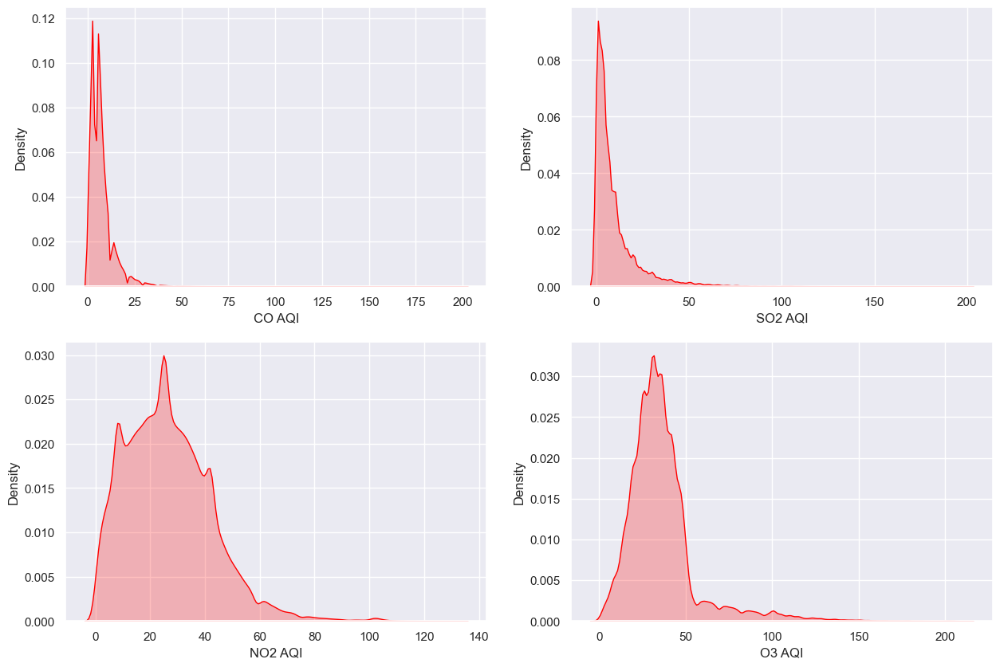

In [39]:
sb.set(rc={"figure.figsize": (15, 10)})

subplot(2,2,1)
ax = sb.kdeplot(data_no_dupl['CO AQI'],fill=True, color= "red")

subplot(2,2,2)
ax = sb.kdeplot(data_no_dupl['SO2 AQI'], fill=True, color= "red")

subplot(2,2,3)
ax = sb.kdeplot(data_no_dupl['NO2 AQI'], fill=True, color= "red")

subplot(2,2,4)
ax = sb.kdeplot(data_no_dupl['O3 AQI'], fill=True, color= "red")

plt.show() 

### observation

a) CO AQI: Most observations fall into the range between 0 and 10 parts per million.

b) SO2 AQI: The majority of data points lie in the range between 0 and 10 parts per million.

c) NO2 AQI: The data distribution nearly follows a normal distribution bell curve, except being slightly right-skewed.

d) O3 AQI: The majority of data points lie in the range between 0 and 50 parts per million, while there can be                    observed a plummet for values greater than 50. Nonetheless, a few observations are present throughout the              area of around 60 to 119 PPM.

### Checking for mistakes in individual variables

In [40]:
# 1.State
print(data_no_dupl['State'].unique())


['Arizona' 'California' 'Colorado' 'District Of Columbia' 'Florida'
 'Illinois' 'Indiana' 'Kansas' 'Kentucky' 'Louisiana' 'Michigan'
 'Missouri' 'New Jersey' 'New York' 'North Carolina' 'Oklahoma'
 'Pennsylvania' 'Texas' 'Virginia' 'Massachusetts' 'Nevada'
 'New Hampshire' 'Tennessee' 'South Carolina' 'Connecticut' 'Iowa' 'Maine'
 'Maryland' 'Wisconsin' 'Country Of Mexico' 'Arkansas' 'Oregon' 'Wyoming'
 'North Dakota' 'Idaho' 'Ohio' 'Georgia']


In [41]:
#Removing all rows containg string 'Country of Mexico' in coloumn 'state'
data_clean1 = data_no_dupl[~data_no_dupl.State.str.contains("Country Of Mexico")]

In [42]:
# 2.City
print(data_clean1['City'].unique())

['Phoenix' 'Scottsdale' 'Tucson' 'Concord' 'Bethel Island' 'San Pablo'
 'Pittsburg' 'Calexico' 'Bakersfield' 'Burbank' 'Los Angeles' 'Long Beach'
 'Hawthorne' 'Costa Mesa' 'Rubidoux' 'Not in a city' 'Arden-Arcade'
 'Victorville' 'Chula Vista' 'San Diego' 'San Francisco' 'Capitan'
 'Lompoc' 'Goleta' 'Vandenberg Air Force Base' 'Davenport' 'Vallejo'
 'Welby' 'Washington' 'Winter Park' 'Chicago' 'Cicero'
 'Calumet City (PU RR name Calumet Park (sta.))'
 'Indianapolis (Remainder)' 'Kansas City' 'Ashland'
 'Lexington-Fayette (corporate name for Lexington)' 'Henderson'
 'Louisville' 'Paducah' 'Baton Rouge' 'Detroit' 'Sunset Hills' 'Ladue'
 'Ferguson' 'St. Ann' 'St. Louis' 'Camden' 'New York' 'Holtsville'
 'Winston-Salem' 'Charlotte' 'Park Hill' 'Ponca City' 'Pittsburgh'
 'Beaver Falls' 'Reading' 'Altoona' 'Bristol' 'Johnstown' 'Scranton'
 'Lancaster' 'New Castle' 'Norristown' 'Freemansburg' 'Philadelphia'
 'Charleroi' 'Greensburg' 'York' 'Dallas' 'El Paso' 'Houston'
 'Seven Corners' 'McLean'

In [43]:
# 3. Date Local 
# Convert Date Local to date format and extract year and month
import datetime as dt

In [44]:
# making copy of the data first to avoid error
data_clean1 = data_clean1[data_clean1['Date Local'].notnull()].copy()
data_clean1['Year_Month'] = pd.to_datetime(data_clean1['Date Local']).dt.strftime('%Y-%m') #Year-Month
data_clean1['Year'] = pd.to_datetime(data_clean1['Date Local']).dt.strftime('%Y') #Year
data_clean1['Month'] = pd.to_datetime(data_clean1['Date Local']).dt.strftime('%m') #Year

/Users/aarush/Downloads/anaconda3/lib/python3.9/site-packages/pandas/core/tools/datetimes.py:1047: UserWarning:

Parsing '13/01/2000' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.

/Users/aarush/Downloads/anaconda3/lib/python3.9/site-packages/pandas/core/tools/datetimes.py:1047: UserWarning:

Parsing '14/01/2000' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.

/Users/aarush/Downloads/anaconda3/lib/python3.9/site-packages/pandas/core/tools/datetimes.py:1047: UserWarning:

Parsing '15/01/2000' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.

/Users/aarush/Downloads/anaconda3/lib/python3.9/site-packages/pandas/core/tools/datetimes.py:1047: UserWarning:

Parsing '16/01/2000' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.

/Users/aarush/Downloads/anaconda3/lib/python3.9/site-packages/pa

Focusing on California, Since California is the most Polluted State

## Analysis : Air Quality (AQI) development over time in California


Taking the AQI index of all four air pollution categories

In [45]:
# create sub data set with relevant variables only
pollution_df = data_clean1[['Year_Month','Year','Month','State','City','NO2 AQI','O3 AQI','SO2 AQI','CO AQI']]

In [46]:
#Selecting California entries only 
pollution_CA = pollution_df [pollution_df['State'] == 'California'].reset_index(drop=True)
print(pollution_CA.head()) 

  Year_Month  Year Month       State     City  NO2 AQI  O3 AQI  SO2 AQI  \
0    2000-01  2000    01  California  Concord       25      25      3.0   
1    2000-02  2000    02  California  Concord       28      27      3.0   
2    2000-03  2000    03  California  Concord       38      12      6.0   
3    2000-04  2000    04  California  Concord       42       9      6.0   
4    2000-05  2000    05  California  Concord       36      19      6.0   

   CO AQI  
0     9.0  
1     9.0  
2    22.0  
3    23.0  
4    19.0  


In [47]:
# For better handling and to prevent data size exceeding plotly data limit, select only 10% of the California data.

CA_10per = pollution_CA.sample(frac=0.5)
CA_10per = CA_10per.sort_values('Year_Month').reset_index(drop=True)

Interactive plotting with Plotly

In [48]:
!pip install cufflinks


In [49]:
!pip install chart_studio


In [50]:
#import chart_studio.tools 
import chart_studio.plotly as pl
import plotly.graph_objects as go


Distribution of AQI values per AQI category in California

In [51]:
# Create two new pd data frames
AQI_time = CA_10per[['Year_Month','NO2 AQI','O3 AQI','SO2 AQI','CO AQI']] # all four AQIs incl. date
AQI = AQI_time.iloc[:,1:]  # all four AQIs only

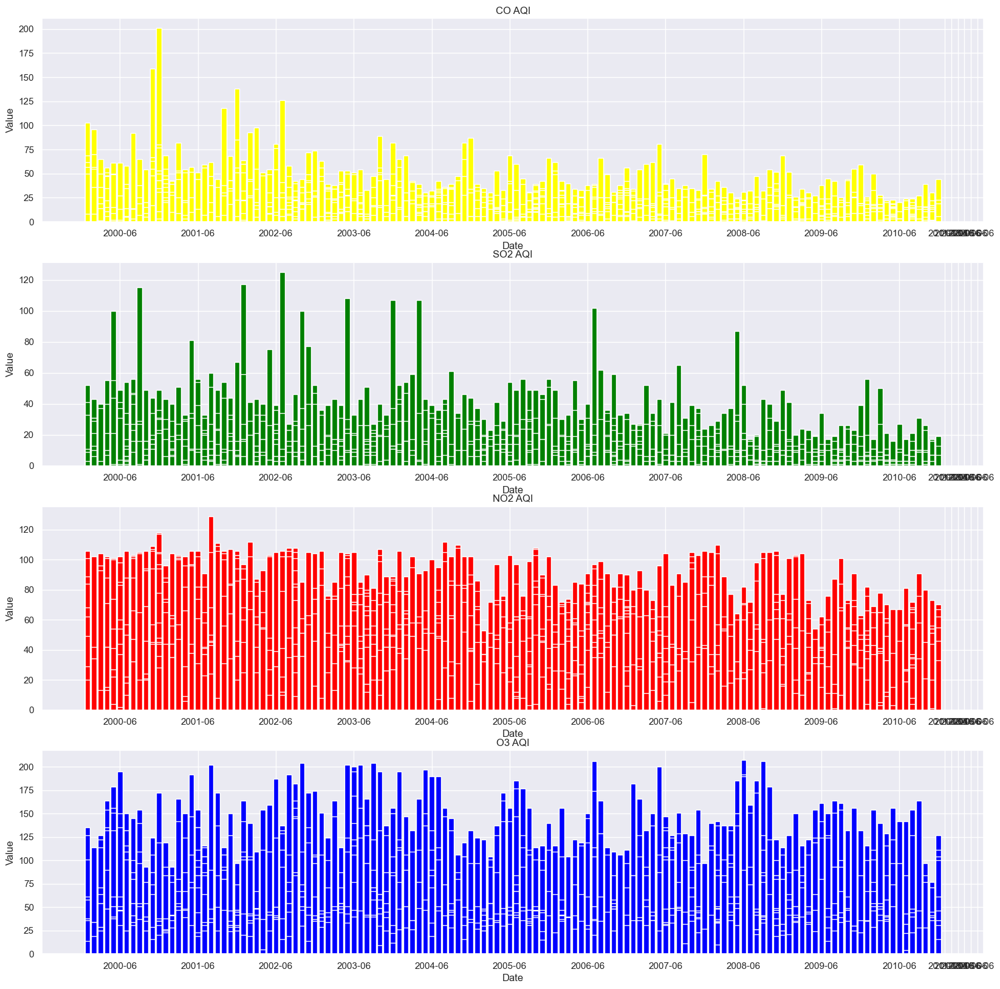

In [53]:
#Subplots for each AQI category over time
fig, (ax1, ax2,ax3,ax4) = plt.subplots(4,1, figsize = (20,20)) 
for ax in ax1, ax2,ax3,ax4:
    ax.set(xlabel='Date')
    ax.set(ylabel='Value')
    
ax1.bar(AQI_time['Year_Month'],AQI_time['CO AQI'], color = 'yellow')
ax1.set_title('CO AQI')
ax1.set_xticks(['2000-06','2001-06','2002-06','2003-06','2004-06','2005-06','2006-06','2007-06','2008-06','2009-06','2010-06','2011-06', '2012-06','2013-06','2014-06','2015-06','2016-06']) 

ax2.bar(AQI_time['Year_Month'], AQI_time['SO2 AQI'], color = 'green')
ax2.set_title('SO2 AQI')
ax2.set_xticks(['2000-06','2001-06','2002-06','2003-06','2004-06','2005-06','2006-06','2007-06','2008-06','2009-06','2010-06','2011-06', '2012-06','2013-06','2014-06','2015-06','2016-06']) 

ax3.bar(AQI_time['Year_Month'],AQI_time['NO2 AQI'], color = 'red')
ax3.set_title('NO2 AQI')
ax3.set_xticks(['2000-06','2001-06','2002-06','2003-06','2004-06','2005-06','2006-06','2007-06','2008-06','2009-06','2010-06','2011-06', '2012-06','2013-06','2014-06','2015-06','2016-06']) 

ax4.bar(AQI_time['Year_Month'],AQI_time['O3 AQI'], color = 'blue')
ax4.set_title('O3 AQI')
ax4.set_xticks(['2000-06','2001-06','2002-06','2003-06','2004-06','2005-06','2006-06','2007-06','2008-06','2009-06','2010-06','2011-06', '2012-06','2013-06','2014-06','2015-06','2016-06']) 

plt.show() 

## Observation
While we observe reoccuring seasonal patterns for all of the four air quality index categories, for CO,SO2 and NO2 we see that values are not as spread as they are for O3 and the overall measured values tend to have declined over the last years. In general, pollution appears to be highest in summer and lowest in winter. 

### Working with the monthly average AQI values

1.Basic line chart with monthly mean values for each AQI category

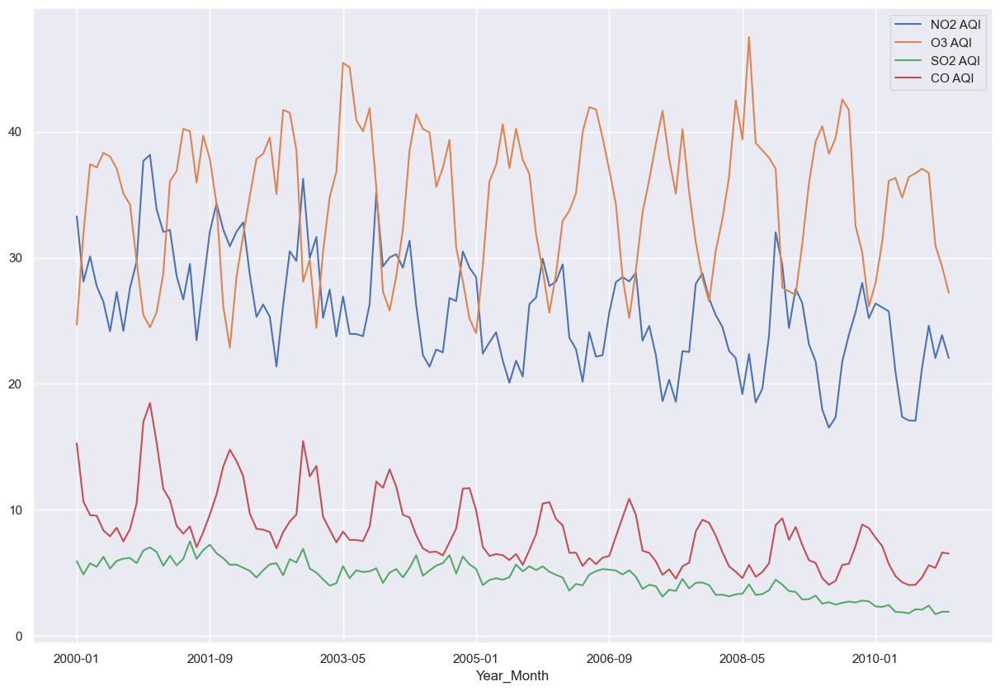

In [56]:
AQI_time_grouped =AQI_time.groupby(['Year_Month']).mean().plot()

2. Interactive scatter plot with several monthly records for each AQI category

In [57]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=CA_10per['Year_Month'], y=CA_10per['NO2 AQI'],
                    mode='lines', name='NO2 AQI', opacity=0.7))
fig.add_trace(go.Scatter(x=CA_10per['Year_Month'], y=CA_10per['O3 AQI'],
                    mode='lines', name='O3 AQI', opacity=0.7))
fig.add_trace(go.Scatter(x=CA_10per['Year_Month'], y=CA_10per['SO2 AQI'],
                    mode='lines', name='SO2 AQI', opacity=1.0))
fig.add_trace(go.Scatter(x=CA_10per['Year_Month'], y=CA_10per['CO AQI'],
                    mode='markers', name='CO AQI', opacity=0.6))
fig.update_layout(legend_title_text = "AQI categories",
                  title='AQI categories 2000-2010')
fig.update_yaxes(title_text="Value (in PPM/PPB)")
fig.update_xaxes(title_text="Time")
fig.show()

## Observation

Both charts represent the relatively wide-spread records of NO2 and O3.
The upper graph shows that their monthly means lie between 20-30 parts per billion and 30-40 parts per million, respectively. 
Noteworthy, though, is the high frequency of very high values measured within months, as shown in the lower graph.

# Key Takeaway

1. All the Major Pollutants mostly lie between the value 0-50ppm, with an exception of O3 with shows some observation with <100 ppm.

2. All 4 Pollutant has a recurring pattern of increase in summer and decrease in winter, with O3 being most resistant to these sesonal changes.

3. Overall measured values of the Pollutants tend to have declined over the last years.

4. NO2 and O3 have more wide-spread records compared to SO2 and CO, with O3 reaching the maximum ppm.